<h1 style="font-family:Times New Roman; font-size: 300%"><center>Advanced Machine Learning For Physics </center></h1>
<h2 style="font-family:Times New Roman; font-weight:bolder; font-size:240%">Hamiltonian Neural Networks</h2>

<p style="font-family:Times New Roman; font-size:120%">
    The following notebook is my recreation of the 2019 <a href = "https://proceedings.neurips.cc/paper_files/paper/2019/file/26cd8ecadce0d4efd6cc8a8725cbd1f8-Paper.pdf">article    </a>, introducing a new form of Neural networks (NN), namely Hamiltonian neural networks (HNN). This form of neural networks is designed for physical systems, that often require conservation of energy, or some other quantity. It does so, by utilizing <b>Hamiltonian mechanics</b>, an important branch of physics, describing the evolution dynamical systems while convserving invariances (often energy).
</p>

<h2 style="font-family:Times New Roman; font-size:200%">Part I | Background |</h2>
<h3 style="font-family:Times New Roman; font-size:150%">Motivation</h3>
<p style="font-family:Times New Roman; font-size:120%">
    While regular neural networks work extremely well for a huge pool of different tasks, it has some flaws with physical systems. When training directly on a physical system, it learns from the data alone, and thus, does not learn any <i>physical laws</i>, but rather just <i>fits</i> itself to the data. This disadvantage is exactly what we will try to optimize, using Hamiltonian mechanics. 
</p>

<h3 style="font-family:Times New Roman; font-size:150%">Hamiltonian Mechanics</h3>


<p style="font-family:Times New Roman; font-size:120%">
    In principle, the Hamiltonian $\mathcal{H}$ is a reformulation (a legendre transformation) of the Lagrangian: $\mathcal{H} = \sum^{}_{i=1} \dot q_ip_i - L$, with <i>conjugate momenta</i> defined as: $p_i. =\frac{\partial L}{\partial \dot q}$. Together, the hamiltonian uses <b>phase space</b> to describe the dynamics. Often however, the hamiltonian simply represents the total energy of the system $\mathcal{H} = \hat T + \hat V$ with $\hat T$ as the kinetic energy, and $\hat V$ as the potential energy. All three of these quantities are functions of <i>canonical</i> variables, the general vector $q$ and its conjugate momentum $p$. In this project, the hamiltonian will always represent the total energy of the system. The dynamics of the system are governed by the equations:
</p>
$$
\boxed{ \bf \dot q = \frac{\partial \mathcal{H}}{\partial \bf p}, \bf \dot p =- \frac{\partial \mathcal{H}}{\partial \bf q}}
$$

<h3 style="font-family:Times New Roman; font-size:150%">Method</h3>

<p style="font-family:Times New Roman; font-size:120%">
    We will use the same method as the article. First, we obtain the differential equation(s) describing the system. Using the RK4 method, data will be generated both for testing and training, this is the <i>numeric</i> solution for the system, which we will treat as analytical. Using this data, we will pass the coordinate pair (q,p) to a model, which will return a single number, $\mathcal{H}_\theta$ (The model has one hidden layer with 200 nodes). We want the output, H, to be an estimate for the hamiltonian of the system, hence preferably constant. We will obtain $(\dot q, \dot p)$ by using the hamiltonian equations above, hence calculating the derivative of the output with respect to the input. The loss function we use is: 
</p>

$$
\boxed{\mathcal{L}_{HNN} = \left\lVert\frac{\partial \mathcal{H}_\theta}{\partial \bf p} -\frac{\partial \bf q}{\partial t} \right\rVert_2 + \left\lVert\frac{\partial \mathcal{H}_\theta}{\partial \bf q} +\frac{\partial \bf p}{\partial t} \right\rVert_2}
$$
<p style="font-family:Times New Roman; font-size:120%">
    This model will be compared to a <b>baseline</b> model, which is exactly the same, but it returns $(\dot q, \dot p)$ directly. Thus, there are no hamiltonian mechanics used in this model.
</p>
<h2 style="font-family:Times New Roman; font-size:200%">Part II | Initializing |</h2>
<p style="font-family:Times New Roman; font-size:120%">
    First, the noteboook will be directed to the correct enviroment, and the neccessary packages will be imported. Then we will define the functions we will need for the project
</p>

In [122]:
import Pkg; Pkg.activate(".julia/environments/v1.10/Project.toml")
Pkg.add(["Optimisers","NBInclude"])
using Flux, Plots, Zygote, Optimisers, Statistics, Random, NBInclude
import Distributions: Uniform
#using DifferentialEquations

  Activating project at `~/.julia/environments/v1.10`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`


In [123]:
?generate_data

search: generate_data generate_two_random_numbers



```
generate_data(f,n_samples, n_obs, tend; kwargs...)
```

Solves ODE/caluclates trajectory with f

# Arguments

  * `f`: The function to be processed.
  * `n_samples::Int`: The number of samples to process.
  * `n_obs::Int`: The number of observations for each sample.
  * `tend::Float64`: The end time for the operation.

# Keyword Arguments

  * `inits=nothing`: Initial values.
  * `model=nothing`: The model used by HNN and DHNN.
  * `training=false`: Whether to run in training mode.
  * `sampler=nothing`: The sampler to use for initial values.
  * `sigma=0.0`: noise.
  * `rho=nothing`: friction coeff. for DHNN.

# Returns

  * t_span: time steps
  * x: the input data
  * y: the deerivatives (output data)


In [124]:
@nbinclude("Utilities.ipynb") #Loading functions I've defined for this notebook

meshgrid

In [125]:
function loss_b(m,x, y) #Baselie Loss
    y_hat = m(x)
    y_hat_x,y_hat_v = y_hat
    y_x, y_v = y
    return 1/length(y)*( sum((y_hat_x-y_x).^2+(y_hat_v-y_v).^2))
end

function lossHNN(mod, input, label) #HNN Loss
    H = gradient(sum ∘ mod,input)[1] #dH/dx, dH/dp
    n = size(H, 1) ÷ 2
    pred=vcat(selectdim(H, 1, (n + 1):(2n)), -selectdim(H, 1, 1:n)) # dH/dx, dH/dp --> dH/dp, -dH/dx
    return mean(abs2, pred .- label)
end

function hnn_sim(model, input) #Obtainint HNN dynamics of a trained model
    #Hamiltonian = model(input)
    H = gradient(sum ∘ model,input)[1] 
    n = size(H, 1) ÷ 2
    pred=vcat(selectdim(H, 1, (n + 1):(2n)), -selectdim(H, 1, 1:n))
    return pred
end

function fetch_models(input_dim=2, hidden_dim=200, output_dim=2) #Defining baseline model and HNN model
    BaseLine = Flux.Chain(
        Flux.Dense(input_dim, hidden_dim, tanh),   
        Flux.Dense(hidden_dim, hidden_dim, tanh), 
        Flux.Dense(hidden_dim, output_dim, tanh)  
    )
    HNN= Flux.Chain(
        Flux.Dense(input_dim, hidden_dim, tanh),
        Flux.Dense(hidden_dim, hidden_dim, tanh),
        Flux.Dense(hidden_dim, 1, tanh)
    )
    return BaseLine, HNN
end

fetch_models (generic function with 4 methods)

<h2 style="font-family:Times New Roman; font-size:200%">Part III | Mass-spring system |</h2>

<p style="font-family:Times New Roman; font-size:120%">
    Perhaps the most simple dynamical physical system one can think of. And fittingly, the first example in their paper, as well as my own code here. It is governed by a simple differential equation.
</p>

$$
m\ddot x = -kx \longrightarrow \begin{cases}
    \frac{dx}{dt}= v \\
    m\frac{dv}{dt}=-kx
  \end{cases}
$$
    
<p style="font-family:Times New Roman; font-size:120%">
    As we will in all the systems here, we have split the second order ODE into two first order ODE's, and as the original paper did, we will assume that $k=m=1$
</p>
    
<h3 style="font-family:Times New Roman; font-size:150%">Initializing Data</h3>

In [126]:
function sampler_spring(n_sims) #Loads Initial conditions
    r = rand(Uniform(0.4,1.5), n_sims)
    phi = rand(Uniform(0,2*pi),n_sims)
    x= @. r * cos(phi)
    y= @. r * sin(phi)

    return vcat(x', y')
end
function Ham_spring(q,p) #Hamiltonian
    H = @. q^2/2+p^2/2
    return H
end

function grads(y) #ODE of Mass-Spring
    x = y[1,:,:]
    v = y[2,:,:]
    return permutedims(hcat(v, -x))
end

grads (generic function with 1 method)

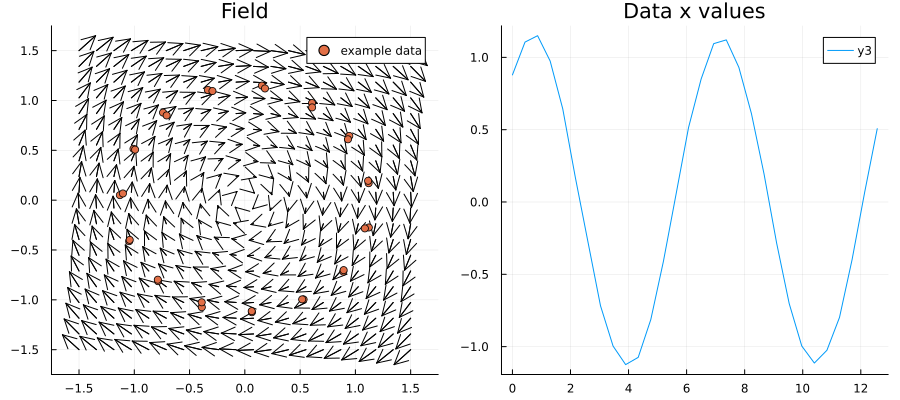

In [127]:
fieldd = meshgrid(20, train=false)#X and Y coordinates
spring_field = grads(fieldd) .*0.1 #Gradients

t, x_train,y_train = generate_data(grads, 25, 30, 4*pi, sigma=0.01, sampler=sampler_spring)
_, x_test, y_test = generate_data(grads, 1, 30, 4*pi, sigma=0.01, sampler=sampler_spring)

quiver(fieldd[1, :],fieldd[2, :],quiver=(spring_field[1, :], spring_field[2, :]), layout=(1,2),size=(900,400), label="train data",c=:black, title="Field")
scatter!(x_train[1,:,1], x_train[2,:,1], label="example data",subplot=1)
plot!(t,x_train[2,:,1], subplot=2, title="Data x values")

<h3 style="font-family:Times New Roman; font-size:150%">Training the Models</h3>

In [128]:
baseline, hnn_spring=fetch_models()

baseline=train_model(baseline, loss_b, x_train, y_train, x_test, y_test)
hnn_spring = train_model(hnn_spring, lossHNN, x_train, y_train, x_test, y_test)

Epoch=100 :loss = 0.0006147600129797738
Epoch=200 :loss = 0.0006759508265506722
Epoch=300 :loss = 0.0007193628311915926
Epoch=400 :loss = 0.000608073600244162
Epoch=500 :loss = 0.00069773367958213
Epoch=600 :loss = 0.0006994338368427795
Epoch=700 :loss = 0.0007248645160592177
Epoch=800 :loss = 0.0007402715563552545
Epoch=900 :loss = 0.0007866894213573921
Epoch=1000 :loss = 0.0008612024656093906
Epoch=1100 :loss = 0.0008111867771858265
Epoch=1200 :loss = 0.0008636866882894692
Epoch=1300 :loss = 0.0009327720913790218
Epoch=1400 :loss = 0.0008843559665711691
Epoch=1500 :loss = 0.0008932360481271151
Epoch=1600 :loss = 0.0007162873380420834
Epoch=1700 :loss = 0.0007141849500012481
Epoch=1800 :loss = 0.0007262565388904542
Epoch=1900 :loss = 0.0006137801708445167
Epoch=2000 :loss = 0.0005958942109727602
Epoch=100 :loss = 0.00655765611540737
Epoch=200 :loss = 0.005719411892830181
Epoch=300 :loss = 0.00789469447265065
Epoch=400 :loss = 0.006749986555694807
Epoch=500 :loss = 0.000229569718655474

Chain(
  Dense(2 => 200, tanh),                # 600 parameters
  Dense(200 => 200, tanh),              # 40_200 parameters
  Dense(200 => 1, tanh),                # 201 parameters
)                   # Total: 6 arrays, 41_001 parameters, 160.535 KiB.

<h3 style="font-family:Times New Roman; font-size:150%">Evaluating the Models</h3>

In [129]:
t, est_hnn, _ = generate_data(hnn_sim, 1, 400, 20, sampler=sampler_spring, model = hnn_spring)
t, anal_data, _ = generate_data(grads, 1, 400, 20, inits= est_hnn[:,1])
t, est_baseline, _ = generate_data(baseline, 1, 400, 20, sampler=sampler_spring,inits= est_hnn[:,1])

function MSE(true_x, base_x)
    return vec(mean((true_x .- base_x).^2, dims=1))
end
E_pend_hnn = Energy(Ham_spring, est_hnn[1,:], est_hnn[2,:])
E_pend_anal = Energy(Ham_spring, anal_data[1,:], anal_data[2,:])
E_pend_base = Energy(Ham_spring, est_baseline[1,:], est_baseline[2,:])
mse_hnn = MSE(est_hnn, anal_data)
mse_base = MSE(est_baseline, anal_data)
true_h = vec(hnn_spring(anal_data))
base_h =vec(hnn_spring(est_baseline))
hnn_h = vec(hnn_spring(est_hnn))

400-element Vector{Float32}:
 -0.64051473
 -0.64051473
 -0.64051473
 -0.6405149
 -0.640515
 -0.640515
 -0.640515
 -0.64051515
 -0.64051515
 -0.6405153
 -0.64051515
 -0.6405155
 -0.64051545
  ⋮
 -0.6405439
 -0.64054406
 -0.640544
 -0.64054406
 -0.64054406
 -0.6405441
 -0.6405444
 -0.64054435
 -0.6405445
 -0.6405446
 -0.6405445
 -0.64054465

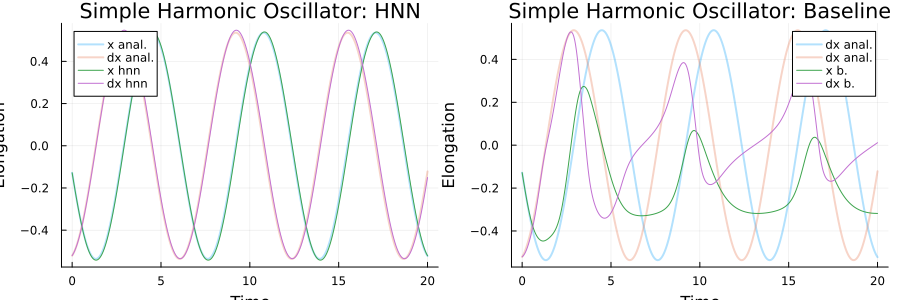

In [130]:

gr()
p = plot(t, anal_data[1,:], title = "Simple Harmonic Oscillator: HNN",
    xaxis = "Time", yaxis = "Elongation", label = "x anal.", layout=(1,2), size=(900, 300), dpi=10,alpha=.3,linewidth=2)
plot!(p,t, anal_data[2,:],
    xaxis = "Time", yaxis = "Elongation", label = "dx anal.", subplot=1,alpha=.3,linewidth=2)
plot!(p,t, anal_data[1,:], label = "dx anal.", subplot=2,alpha=.3,linewidth=2)
plot!(p,t, anal_data[2,:], label = "dx anal.", subplot=2,alpha=.3,linewidth=2)


plot!(p,t, est_baseline[1,:], label="x b.",title = "Simple Harmonic Oscillator: Baseline", subplot=2)
plot!(p,t, est_baseline[2,:], label="dx b.", subplot=2)
plot!(p,t, est_hnn[1,:], label="x hnn", subplot=1)
plot!(p,t, est_hnn[2,:], label="dx hnn",  subplot=1)

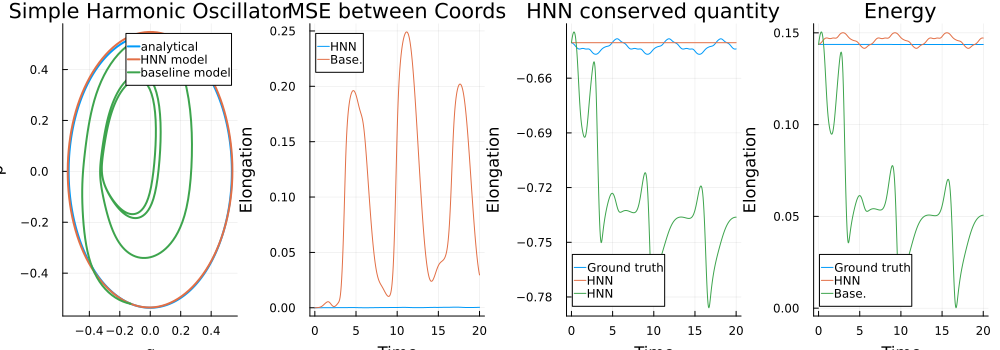

In [131]:


p = plot(anal_data[1,:], anal_data[2,:], linewidth = 2, title = "Simple Harmonic Oscillator",
    xaxis = "Time", yaxis = "Elongation", label = "analytical", layout=(1,4), size=(1000, 350))
plot!(p,est_hnn[1,:], est_hnn[2,:], linewidth = 2, title = "Simple Harmonic Oscillator",
    xaxis = "q", yaxis = "p", label = "HNN model", subplot=1)
plot!(p,est_baseline[1,:], est_baseline[2,:], linewidth = 2, title = "Simple Harmonic Oscillator",
    xaxis = "q", yaxis = "p", label = "baseline model", subplot=1)

plot!(p,t, mse_hnn, label="HNN", title = "MSE between Coords", subplot=2)
plot!(p,t, mse_base, label="Base.", subplot=2)
plot!(p,t, true_h, label="Ground truth", title = "HNN conserved quantity", subplot=3)
plot!(p,t, hnn_h, label="HNN", subplot=3)
plot!(p,t, base_h, label="HNN", subplot=3)

plot!(p,t, E_pend_anal, label="Ground truth", title = "Energy", subplot=4)
plot!(p,t, E_pend_hnn, label="HNN", subplot=4)
plot!(p,t, E_pend_base, label="Base.", subplot=4)


<h2 style="font-family:Times New Roman; font-size:200%">Part IV | Ideal Pendulum |</h2>

<p style="font-family:Times New Roman; font-size:120%">
    Now we proceed with another simple, but slightly more challenging system: The ideal pendulum. with $q=\theta$ and $p = ml^2\frac{\partial \theta}{\partial t}$, l=m=1 and g=3 we get:
</p>
$$H= mgl(1- \cos{q})+\frac{l^2p^2}{2m} \rightarrow 3(1- \cos{q})+\frac{p^2}{2}$$
<p style="font-family:Times New Roman; font-size:120%">
energies are sampled between [1.3, 2.3], we sample data using the equations:
</p>
$$\frac{dq}{dt} = p, \frac{dp}{dt} = -3\sin{q}$$

In [132]:
function pendulum(q,p) #Hamiltonian for pendulum
    H = @. 3(1−cos(q))+p^2/2
    return H
end

pendulum (generic function with 1 method)

<h3 style="font-family:Times New Roman; font-size:150%">Initializing the Data</h3>

In [133]:
function sample_pend(num_samples) #samples initial values
    data = zeros((2,num_samples))
    i=1
    while i<num_samples+1
        # Random value for the Hamiltonian
        H = rand(Uniform(1.3, 2.3))

        q = rand() * 2 * pi - pi  # Random q between -π and π

        p_squared = 2 * (H - 6 * (1 - cos(q)))
        if p_squared < 0
            continue
        end
        p = sqrt(p_squared)
        data[:,i] .= q,p
        i+=1
    end
    return data
end

function grads_ideal_pend(y) #ODE for pendulum
    q = y[1,:]
    p = y[2,:]
    dq_dt=p
    dp_dt = @. -3*sin(q)
    return permutedims(hcat(dq_dt, dp_dt))
end

grads_ideal_pend (generic function with 1 method)

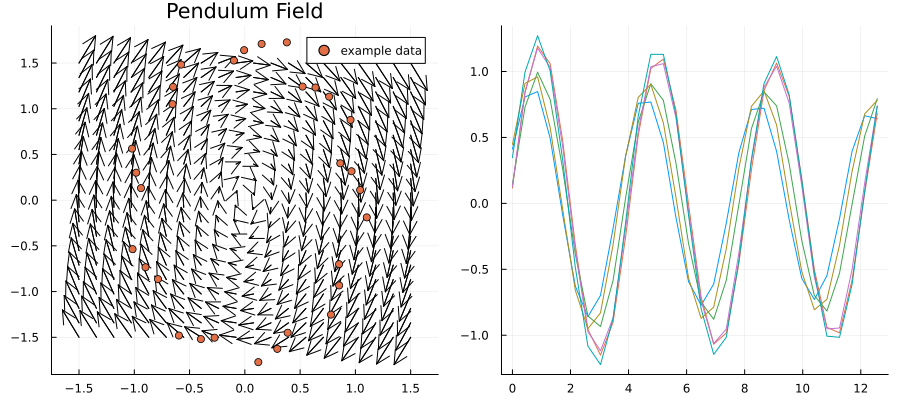

In [134]:
fieldd = meshgrid(20, train=false)
spring_field = grads_ideal_pend(fieldd).*0.1

t, x_train,y_train = generate_data(grads_ideal_pend, 25, 30, 4*pi, sigma=0.01, sampler=sample_pend)
_, x_test, y_test = generate_data(grads_ideal_pend, 1, 30, 4*pi, sigma=0.01, sampler=sample_pend)
gr()
quiver(fieldd[1, :],fieldd[2, :],quiver=(spring_field[1, :], spring_field[2, :]), layout=(1,2),size=(900,400), title="Pendulum Field", label="train data",c=:black)
for i in 2:7
    plot!(t, x_train[1,:,i], subplot=2,legend=false)
end
scatter!(x_train[1,:,1], x_train[2,:,1], label="example data",subplot=1)

<h3 style="font-family:Times New Roman; font-size:150%">Training the Models</h3>

In [135]:
baseline_p, hnn_pend = fetch_models()
baseline_p=train_model(baseline_p, loss_b, x_train, y_train, x_test, y_test)
hnn_pend = train_model(hnn_pend, lossHNN, x_train, y_train, x_test, y_test)

Epoch=100 :loss = 0.005346112641929477
Epoch=200 :loss = 0.0053466776122471004
Epoch=300 :loss = 0.005345788068644207
Epoch=400 :loss = 0.005355048299500187
Epoch=500 :loss = 0.005374064188154418
Epoch=600 :loss = 0.0054014210185724994
Epoch=700 :loss = 0.00540789297764414
Epoch=800 :loss = 0.005394750406967848
Epoch=900 :loss = 0.005401650129088161
Epoch=1000 :loss = 0.005400379211460801
Epoch=1100 :loss = 0.0053340387722099385
Epoch=1200 :loss = 0.005415271346824846
Epoch=1300 :loss = 0.00541460931011273
Epoch=1400 :loss = 0.005405844871048088
Epoch=1500 :loss = 0.005408579981826575
Epoch=1600 :loss = 0.005413323673964783
Epoch=1700 :loss = 0.005400807783105885
Epoch=1800 :loss = 0.005407019309067901
Epoch=1900 :loss = 0.005413444826326191
Epoch=2000 :loss = 0.005413537257129848
Epoch=100 :loss = 0.11807110702886837
Epoch=200 :loss = 0.04204172776883418
Epoch=300 :loss = 0.024033777087312674
Epoch=400 :loss = 0.012425976368457848
Epoch=500 :loss = 0.008411309100644393
Epoch=600 :loss

Chain(
  Dense(2 => 200, tanh),                # 600 parameters
  Dense(200 => 200, tanh),              # 40_200 parameters
  Dense(200 => 1, tanh),                # 201 parameters
)                   # Total: 6 arrays, 41_001 parameters, 160.535 KiB.

<h3 style="font-family:Times New Roman; font-size:150%">Evaluating the Models</h3>

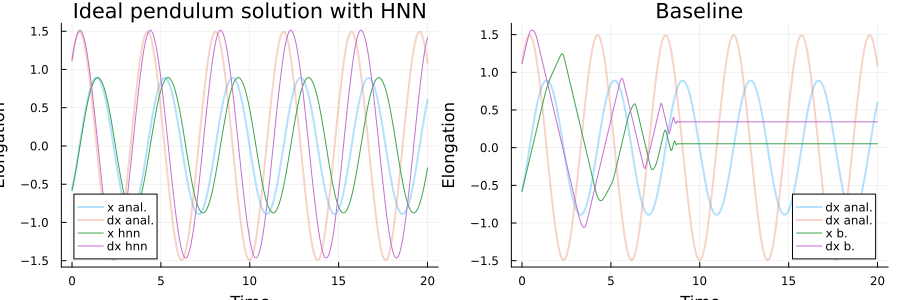

In [136]:
t, est_hnn, _ = generate_data(hnn_sim, 1, 400, 20, sampler=sample_pend, model = hnn_pend)
t, anal, _ = generate_data(grads_ideal_pend, 1, 400, 20, inits= est_hnn[:,1])
t, est_baseline, _ = generate_data(baseline_p, 1, 400, 20,inits= est_hnn[:,1])
gr()
p = plot(t, anal[1,:], title = "Ideal pendulum solution with HNN",
    xaxis = "Time", yaxis = "Elongation", label = "x anal.", layout=(1,2), size=(900, 300),alpha=.3,linewidth=2)
plot!(p,t, anal[2,:],xaxis = "Time", yaxis = "Elongation", label = "dx anal.", subplot=1,alpha=.3,linewidth=2)
plot!(p,t, anal[1,:], label = "dx anal.", subplot=2,title = "Baseline",alpha=.3,linewidth=2)
plot!(p,t, anal[2,:], label = "dx anal.", subplot=2,alpha=.3,linewidth=2)


plot!(p,t, est_baseline[1,:], label="x b.", subplot=2)
plot!(p,t, est_baseline[2,:], label="dx b.", subplot=2)
plot!(p,t, est_hnn[1,:], label="x hnn", subplot=1)
plot!(p,t, est_hnn[2,:], label="dx hnn",  subplot=1)

In [137]:
mse_hnn = MSE(est_hnn, anal)
mse_base = MSE(est_baseline, anal)

true_h = vec(hnn_pend(anal))
base_h =vec(hnn_pend(est_baseline))
hnn_h = vec(hnn_pend(est_hnn))
            
E_pend_hnn = Energy(pendulum, est_hnn[1,:], est_hnn[2,:])
E_pend_anal = Energy(pendulum, anal[1,:], anal[2,:])
E_pend_base = Energy(pendulum, est_baseline[1,:], est_baseline[2,:])


400-element Vector{Float64}:
 1.1147673225651795
 1.0932094703161064
 1.080619126695392
 1.0771766403217389
 1.0830429787905032
 1.0983371863374711
 1.1228518584499805
 1.15361583796647
 1.1821122596829268
 1.201990680710654
 1.2124616764942564
 1.2156087274738092
 1.2145013284364552
 ⋮
 0.06250417368317003
 0.06250419720756224
 0.06250421108401535
 0.06250419544518321
 0.06250418320673137
 0.06250418366436997
 0.0625042000096672
 0.06250419463344545
 0.06250419100285243
 0.0625041961862896
 0.06250419255569617
 0.06250421436801525

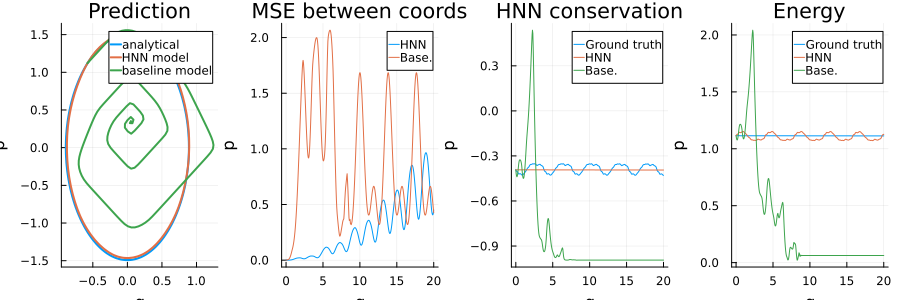

In [138]:

p = plot(anal[1,:], anal[2,:], linewidth = 2, title = "Simple Harmonic Oscillator",
    xaxis = "q", yaxis = "p", label = "analytical", layout=(1,4), size=(900, 300))
plot!(p,est_hnn[1,:], est_hnn[2,:], linewidth = 2, title = "Simple Harmonic Oscillator",
    xaxis = "q", yaxis = "p", label = "HNN model", subplot=1)
plot!(p,est_baseline[1,:], est_baseline[2,:], linewidth = 2, title = "Prediction",
    xaxis = "q", yaxis = "p", label = "baseline model", subplot=1)

plot!(p,t, mse_hnn, label="HNN", title = "MSE between coords", subplot=2)
plot!(p,t, mse_base, label="Base.", subplot=2)

plot!(p,t, true_h, label="Ground truth", title = "HNN conservation", subplot=3)
plot!(p,t, hnn_h, label="HNN", subplot=3)
plot!(p,t, base_h, label="Base.", subplot=3)

plot!(p,t, E_pend_anal, label="Ground truth", title = "Energy", subplot=4)
plot!(p,t, E_pend_hnn, label="HNN", subplot=4)
plot!(p,t, E_pend_base, label="Base.", subplot=4)


<h2 style="font-family:Times New Roman; font-size:200%">Part V | Real Pendulum |</h2>

<p style="font-family:Times New Roman; font-size:120%">
    We will now explore further upon the last example. Until now, only pefectly harmonic systems have been analyzed, but now we will have a look at actual data from a real pendulum and see how our models fare. This will of course introduce some friction.
</p>

In [139]:
function grads_ideal_pend(y)
    q = y[1,:]
    p = y[2,:]
    dq_dt=p
    dp_dt = @. -2.4*sin(q) #Change of constants
    return permutedims(hcat(dq_dt, dp_dt))
end
function compute_velocities(positions::Matrix{Float64}, times::Vector{Float64})::Matrix{Float64}
    n = length(positions[1,:])
    velocities = zeros(Float64, 2, n)
    velocities[:,1] = @. (positions[:,2] - positions[:,1]) / (times[2] - times[1])

    for i in 2:n-1
        velocities[:,i] = @. (positions[:,i+1] - positions[:,i-1]) / (times[i+1] - times[i-1])
    end
    velocities[:,n] = @. (positions[:,n] - positions[:,n-1]) / (times[n] - times[n-1])

    return velocities
end

compute_velocities (generic function with 1 method)

<h3 style="font-family:Times New Roman; font-size:150%">Loading Data with Train/Test split</h3>

In [140]:
using DelimitedFiles

Data = readdlm("/Users/aleksandersekkelsten/Downloads/invar_datasets/real_pend_h_1.txt")
x_vals = vcat(Data[2:end,3]',Data[2:end,4]') 

x_vals = Matrix{Float64}(x_vals)#X positions
t = Array{Float64}(Data[2:end,2])
dxs = compute_velocities(x_vals, t) #Calculating the velocities
data = Dict("x" => x_vals, "dx" => dxs, "t" => t) #storing the data in a dictionary

Dict{String, Array{Float64}} with 3 entries:
  "t"  => [5.0, 5.16667, 5.33333, 5.5, 5.66667, 6.0, 6.16667, 6.33333, 6.5, 6.6…
  "x"  => [1.13839 1.27536 … 0.775497 0.735934; 0.91978 0.71938 … -0.207696 -0.…
  "dx" => [0.821802 0.753945 … -0.20721 -0.237383; -1.2024 -1.2595 … -0.90238 -…

In [141]:
test_split=0.8
b = Int(round(length(data["x"][1,:]) * test_split))
Keys = keys(data)
Values = values(data)
split = Dict()
for (i, key) in enumerate(Keys)
    vals = data[key]

    if key!="t"
        split[key] = vals[:,1:b]#hcat(vals[:,1:a], vals[:,b:end])
        split["test_"*key] = vals[:,b:end]
    else
        split[key] = vals[1:b]#vcat(vals[1:a], vals[b:end])
        split["test_"*key] = vals[b:end]
    end
    
end
data=split
x_train = data["x"]
y_train = data["dx"]

x_test = data["test_x"]
y_test = data["test_dx"]

2×112 Matrix{Float64}:
  0.959947   0.844946   0.705544  …  -0.059404  -0.20721  -0.237383
 -0.349674  -0.537673  -0.640818     -0.885487  -0.90238  -0.903559

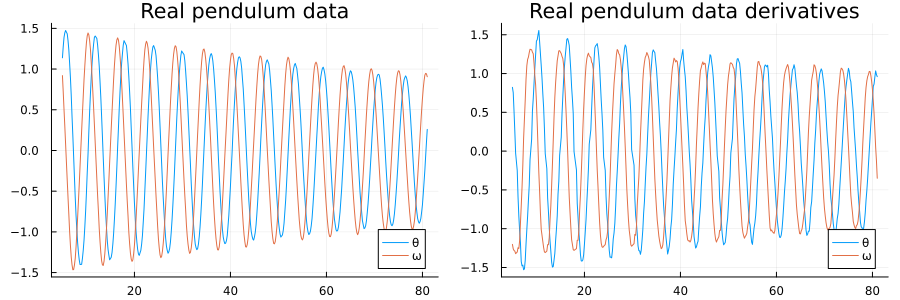

In [142]:
p = plot(data["t"], data["x"][1,:], title="Real pendulum data", label="θ", layout=(1,2), size=(900, 300))
plot!(p,data["t"], data["x"][2,:], label="ω", subplot=1)
plot!(p,data["t"], data["dx"][1,:], title="Real pendulum data derivatives", label="θ", subplot=2)
plot!(p,data["t"], data["dx"][2,:], label="ω", subplot=2)

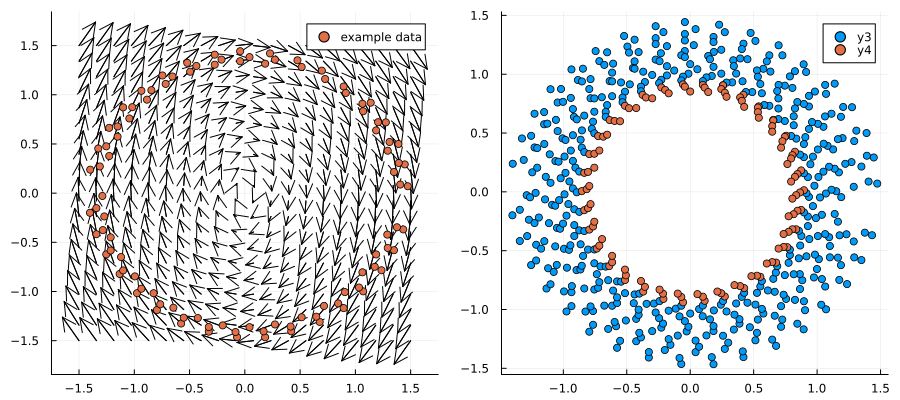

In [143]:
pend_field = grads_ideal_pend(fieldd).*0.1

quiver(fieldd[1, :],fieldd[2, :],quiver=(pend_field[1, :], pend_field[2, :]), layout=(1,2),size=(900,400), label="train data",c=:black)
scatter!(x_train[1,1:100], x_train[2,1:100], label="example data",subplot=1)
scatter!(x_train[1,:], x_train[2,:],subplot=2)
scatter!(x_test[1,:], x_test[2,:], subplot=2)

<h3 style="font-family:Times New Roman; font-size:150%">Training the Models</h3>

In [144]:
baseline_p_real, hnn_pend_real = fetch_models()
baseline_p_real = train_model(baseline_p_real, loss_b, x_train, y_train, x_test, y_test)
hnn_pend_real = train_model(hnn_pend_real, lossHNN, x_train, y_train, x_test, y_test)

Epoch=100 :loss = 0.00236602682634982
Epoch=200 :loss = 0.0023997615836760353
Epoch=300 :loss = 0.0024018962671974774
Epoch=400 :loss = 0.0024040496918435587
Epoch=500 :loss = 0.0024061314237628843
Epoch=600 :loss = 0.0024080761534589564
Epoch=700 :loss = 0.002409857987849678
Epoch=800 :loss = 0.0024114670147911917
Epoch=900 :loss = 0.0024129126660032223
Epoch=1000 :loss = 0.0024142035137286193
Epoch=1100 :loss = 0.0024153554230090936
Epoch=1200 :loss = 0.002416381574941531
Epoch=1300 :loss = 0.0024172944266218546
Epoch=1400 :loss = 0.002418109137511432
Epoch=1500 :loss = 0.0024188354314154214
Epoch=1600 :loss = 0.002419484802013929
Epoch=1700 :loss = 0.0024200679781046664
Epoch=1800 :loss = 0.002420591405116211
Epoch=1900 :loss = 0.0024210603267840964
Epoch=2000 :loss = 0.0024214837532657713
Epoch=100 :loss = 0.29735542352886124
Epoch=200 :loss = 0.015585094648563419
Epoch=300 :loss = 0.013186409970397207
Epoch=400 :loss = 0.011694542947971929
Epoch=500 :loss = 0.010589661296694221
Ep

Chain(
  Dense(2 => 200, tanh),                # 600 parameters
  Dense(200 => 200, tanh),              # 40_200 parameters
  Dense(200 => 1, tanh),                # 201 parameters
)                   # Total: 6 arrays, 41_001 parameters, 160.535 KiB.

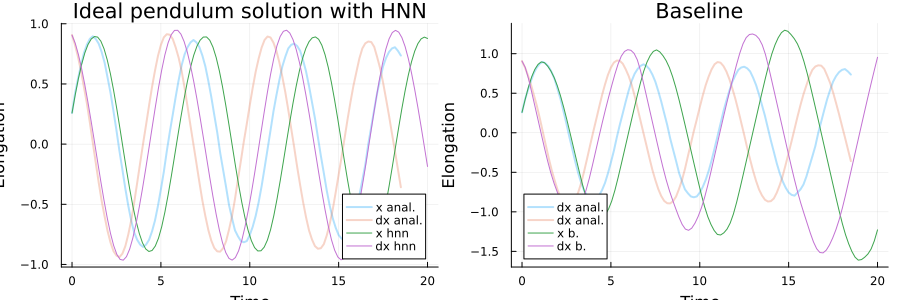

In [145]:
t_ar=data["test_t"] .-minimum(data["test_t"])
n_steps = length(t_ar)
t_end = t_ar[end]
anal = data["test_x"]

t, est_hnn, _ = generate_data(hnn_sim, 1, length(anal[1,:]), 20, model = hnn_pend_real, inits=anal[:,1])
t, est_baseline, _ = generate_data(baseline, 1, length(anal[1,:]), 20,inits= est_hnn[:,1])


gr()
p = plot(t_ar, anal[1,:], title = "Ideal pendulum solution with HNN",
    xaxis = "Time", yaxis = "Elongation", label = "x anal.", layout=(1,2), size=(900, 300),alpha=.3,linewidth=2)
plot!(t_ar, anal[2,:],xaxis = "Time", yaxis = "Elongation", label = "dx anal.", subplot=1,alpha=.3,linewidth=2)
plot!(p,t_ar, anal[1,:], label = "dx anal.", subplot=2,title = "Baseline",alpha=.3,linewidth=2)
plot!(p,t_ar, anal[2,:], label = "dx anal.", subplot=2,alpha=.3,linewidth=2)


plot!(p,t, est_baseline[1,:], label="x b.", subplot=2)
plot!(p,t, est_baseline[2,:], label="dx b.", subplot=2)
plot!(p,t, est_hnn[1,:], label="x hnn", subplot=1)
plot!(p,t, est_hnn[2,:], label="dx hnn",  subplot=1)

<h3 style="font-family:Times New Roman; font-size:150%">Evaluating the Models</h3>

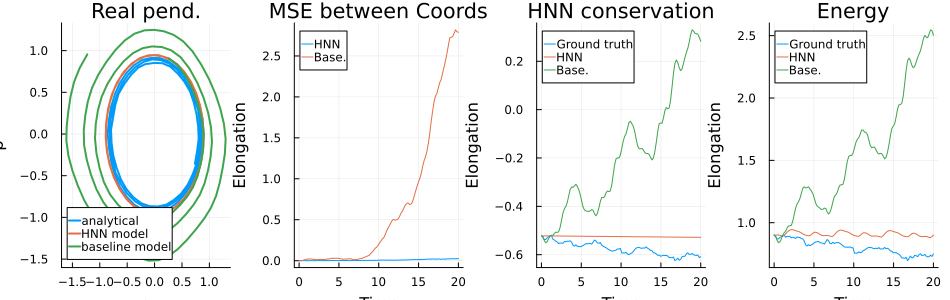

In [146]:
function pendulum_real(q,p)
    H = @. 2.4*(1−cos(q))+p^2
    return H
end
mse_hnn = MSE(est_hnn, anal)
mse_base = MSE(est_baseline, anal)

true_h = vec(hnn_pend_real(anal))
base_h =vec(hnn_pend_real(est_baseline))
hnn_h = vec(hnn_pend_real(est_hnn))
            
E_pend_hnn = Energy(pendulum_real, est_hnn[1,:], est_hnn[2,:])
E_pend_anal = Energy(pendulum_real, anal[1,:], anal[2,:])
E_pend_base = Energy(pendulum_real, est_baseline[1,:], est_baseline[2,:])

p = plot(anal[1,:], anal[2,:], linewidth = 2, title = "Simple Harmonic Oscillator",
    xaxis = "Time", yaxis = "Elongation", label = "analytical", layout=(1,4), size=(950, 300))
plot!(p,est_hnn[1,:], est_hnn[2,:], linewidth = 2, title = "Simple Harmonic Oscillator",
    xaxis = "q", yaxis = "p", label = "HNN model", subplot=1)
plot!(p,est_baseline[1,:], est_baseline[2,:], linewidth = 2, title = "Real pend.",
    xaxis = "q", yaxis = "p", label = "baseline model", subplot=1)

plot!(p,t, mse_hnn, label="HNN", title = "MSE between Coords", subplot=2)
plot!(p,t, mse_base, label="Base.", subplot=2)

plot!(p,t, true_h, label="Ground truth", title = "HNN conservation", subplot=3)
plot!(p,t, hnn_h, label="HNN", subplot=3)
plot!(p,t, base_h, label="Base.", subplot=3)

plot!(p,t, E_pend_anal, label="Ground truth", title = "Energy", subplot=4)
plot!(p,t, E_pend_hnn, label="HNN", subplot=4)
plot!(p,t, E_pend_base, label="Base.", subplot=4)


<h2 style="font-family:Times New Roman; font-size:200%">Part VI | Particle Potential |</h2>

<p style="font-family:Times New Roman; font-size:120%">
    The model worked fine for the real pendulum, but instead of introducing friction, or more external forces, let us introduce more complexity.
</p>
<p style="font-family:Times New Roman; font-size:120%">
    In this example, we shall analyze the potential attraction and repulsion between particles in a crystall. We take use of the widely renowned <i>Lennard-Jones potential</i> given:
    
</p>

$$
V(r_{ij}) = 4\epsilon\cdot \left [ \left (\frac{a}{r_{ij}} \right )^{12}-\left (\frac{a}{r_{ij}} \right )^{6} \right ]
$$

<p style="font-family:Times New Roman; font-size:120%">
    In order to minimize numerical errors, we introduce new scaled and dimensionless coordinates: $x_i = \tilde{x}a, t_i = \tilde{t} \tau, \tau = \sqrt{\frac{ma^2}{\epsilon}}$. Hence, the potential becomes:
</p>

$$
V(r_{ij}) = 4\cdot \left [ \left (\frac{1}{r_{ij}} \right )^{12}-\left (\frac{1}{r_{ij}} \right )^{6} \right ]
$$
<p style="font-family:Times New Roman; font-size:120%">
    When the particles are very far away, the radius is so large that the potential essentially goes to 0. When they get closer, the potential will be attractive, but repulsive if they get too close. Thus, under the right conditions, we can use this to generate a vibrating crystal with the particles attracting and repelling eachother. 
    
</p>

In [147]:
V(r) = 4*((1/abs(r))^12-(1/abs(r))^6) #The potential
Vder(r) = 4*(-12*(1/abs(r))^13+6*(1/abs(r))^7) #The force of the potential: d/dr V(r)
@nbinclude("Untitled33.ipynb") #Loading Functions I've defined for this example

energyN (generic function with 1 method)

In [148]:
function Energy_pot(Velocity, radius) 
    """
    Calculates the mechanical energy of a two-particle system.
    """
    potential = V.(radius)
    kinetic = 0.5*Velocity.^2
    return potential .+ kinetic
end

Energy_pot (generic function with 1 method)

In [149]:
Np = 100
v0Vals, r0valss = Init(Np, 0.01)
t, rV_N, drV_N = @time simulationN(Vder, 1, r0valss, v0Vals, Np, 0.001)
fig = scatter(rV_N[1,1:10:end, 1], rV_N[2,1:10:end, 1],title="Simulation of 100 particles")
for i in 2:Np
    scatter!(fig, rV_N[1,1:10:end, i], rV_N[2,1:10:end, i],legend=false)
end
fig

  0.938748 seconds (2.66 M allocations: 559.863 MiB, 6.81% gc time, 19.53% compilation time)


In [82]:
#= This is code defining the training data
tend = 5
t, rV, drV = simulation2(Vder, tend, [1.1,0], 0.001)

for i in 1:19
    in_r,_ = generate_two_random_numbers(1., 2.5)
    t, rV_N, drV_N = simulation2(Vder, tend, [in_r,0], 0.001)
    rV = hcat(rV, rV_N)
    drV = hcat(drV, drV_N)
end
rV
num_samples = length(rV[1,:])
indices = shuffle(1:num_samples)
test_size=0.2
# Calculate the number of test samples
num_test_samples = round(Int, test_size * num_samples)

# Split the indices into train and test
test_indices = indices[1:num_test_samples]
train_indices = indices[num_test_samples+1:end]
#println(indices)
x_train=rV[:,train_indices]
y_train=drV[:,train_indices]
x_test=rV[:,test_indices]
y_test=drV[:,test_indices]
=#

In [150]:
#= This is code training the models
baseline, hnn_particle = fetch_models(2, 200, 2)

hnn_particle = train_model(hnn_particle, losss, x_train, y_train, x_test, y_test,epochs=10000, batch=true, batch_size=500)
baseline = train_model(baseline, loss_b, x_train, y_train, x_test, y_test,epochs=10000, batch=true, batch_size=500)

Pkg.add("BSON");using BSON: @save
@save "particle_HNN.bson" hnn_particle
@save "particle_baseline.bson" baseline
=#
Pkg.add("BSON")
using BSON: @load

@load "particle_HNN.bson" hnn_particle
@load "particle_baseline.bson" baseline


   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`


In [151]:
ins = [1.5,2.0,2.2]

t, rV, drV = simulation2(Vder, 10, [1.1,0], 0.001)
_, HNN,_ = generate_data(hnn_sim,1, Int(10/0.001), 10; inits = rV[:,1], model=hnn_particle)#simulation2(Vder, 10, [1.2,0.], 0.001)
p=plot(t, rV[1,:], layout=4,label="Anal",subplot=4,size=(900,700),alpha=.3,linewidth=2)
plot!(p,t, HNN[1,:],label="HNN",subplot=4)
plot!(p,t, rV[2,:],label="Anal",subplot=4,alpha=.3,linewidth=2)
plot!(p,t, HNN[2,:],label="HNN",subplot=4)
for (i,r) in enumerate(ins)
    t, rV, drV = simulation2(Vder, 10, [r,0], 0.001)
    _, HNN,_ = generate_data(hnn_sim,1, Int(10/0.001), 10; inits = rV[:,1], model=hnn_particle)#simulation2(Vder, 10, [1.2,0.], 0.001)
    plot!(p,t, rV[1,:],label="Anal",subplot=i,alpha=.3,linewidth=2)
    plot!(p,t, HNN[1,:],label="HNN",subplot=i)
    plot!(p,t, rV[2,:],label="Anal",subplot=i,alpha=.3,linewidth=2)
    plot!(p,t, HNN[2,:],label="HNN",subplot=i)
end
display(p)

In [152]:
ins = [1.5,2.0,2.2]

t, rV, drV = simulation2(Vder, 10, [1.1,0], 0.001)
_, HNN,_ = generate_data(hnn_sim,1, Int(10/0.001), 10; inits = rV[:,1], model=hnn_particle)#simulation2(Vder, 10, [1.2,0.], 0.001)
HNN=Energy_pot(HNN[2,:], HNN[1,:])
rV=Energy_pot(rV[2,:], rV[1,:]) 
HNN=abs.((maximum(HNN).-HNN)/(maximum(HNN)+minimum(HNN))*100)
rV=abs.((maximum(rV).-rV)/(maximum(rV)+minimum(rV))*100)
pp=plot(t, rV, layout=4,ylabel="% Error",plot_title="Energy divergence",label="Anal",subplot=4,size=(900,700),alpha=.3,linewidth=2)
plot!(pp,t, HNN,ylabel="% Error",label="HNN",subplot=4)
for (i,r) in enumerate(ins)
    t, rV, drV = simulation2(Vder, 10, [r,0], 0.001)
    _, HNN,_ = generate_data(hnn_sim,1, Int(10/0.001), 10; inits = rV[:,1], model=hnn_particle)#simulation2(Vder, 10, [1.2,0.], 0.001)
    HNN=Energy_pot(HNN[2,:], HNN[1,:])
    rV=Energy_pot(rV[2,:], rV[1,:])
    HNN=abs.((maximum(HNN).-HNN)/(maximum(HNN)+minimum(HNN))*100)
    rV=abs.((maximum(rV).-rV)/(maximum(rV)+minimum(rV))*100)
    plot!(pp,t, rV,ylabel="% Error",label="Anal",subplot=i,alpha=.3,linewidth=2)
    plot!(pp,t, HNN,ylabel="% Error",label="HNN",subplot=i)
end
display(pp)

In [153]:
#= Is there even any point comparing to the baseline?
ins = [1.5,2.0,2.2]

t, rV, drV = simulation2(Vder, 10, [1.1,0], 0.001)
_, HNN,_ = generate_data(hnn_sim,1, Int(10/0.001), 10; inits = rV[:,1], model=hnn_particle)
_, B_Line,_ = generate_data(baseline,1, Int(10/0.001), 10; inits = rV[:,1])

p=plot(t, rV[1,:], layout=4,label="Anal",subplot=4,size=(900,700),alpha=.3,linewidth=2)
plot!(p,t, rV[2,:],label="Anal",subplot=4,alpha=.3,linewidth=2)
plot!(p,t, HNN[1,:],label="HNN",subplot=4)
plot!(p,t, HNN[2,:],label="HNN",subplot=4)
plot!(p,t, B_Line[1,:],label="B.line",subplot=4)
plot!(p,t, B_Line[2,:],label="B.line",subplot=4)

for (i,r) in enumerate(ins)
    t, rV, drV = simulation2(Vder, 10, [r,0], 0.001)
    _, HNN,_ = generate_data(hnn_sim,1, Int(10/0.001), 10; inits = rV[:,1], model=hnn_particle)#simulation2(Vder, 10, [1.2,0.], 0.001)
    _, B_Line,_ = generate_data(baseline,1, Int(10/0.001), 10; inits = rV[:,1])#simulation2(Vder, 10, [1.2,0.], 0.001)
    
    plot!(p,t, rV[1,:],label="Anal",subplot=i,alpha=.3,linewidth=2)
    plot!(p,t, rV[2,:],label="Anal",subplot=i,alpha=.3,linewidth=2)
    plot!(p,t, HNN[1,:],label="HNN",subplot=i)
    plot!(p,t, HNN[2,:],label="HNN",subplot=i)
    plot!(p,t, B_Line[1,:],label="B.line",subplot=i)
    plot!(p,t, B_Line[2,:],label="B.line",subplot=i)
end
display(p)
=#

In [154]:
Np = 100
v0Vals, r0valss = Init(Np, 0.01)
t, rV_N, _ = @time simulationN(Vder, 1, r0valss, v0Vals, Np, 0.001)
_, hnn_sol = particle_ML(hnn_sim_Part, Np, 1, r0valss, v0Vals, 0.001;model=hnn_particle)

  0.197641 seconds (1.35 M allocations: 498.120 MiB, 14.04% gc time)


([0.0, 0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009  …  0.99, 0.991, 0.992, 0.993, 0.994, 0.995, 0.996, 0.997, 0.998, 0.999], [-5.2250000000000005 -5.225189440998646 … -5.674550374396369 -5.674592854976225; -5.2250000000000005 -5.225189440998646 … -5.667201444428012 -5.667229424502173; 0.009390664914940476 0.01965077378888579 … 0.2421748651816459 0.24221520333495272; 0.0015106495557421567 0.001292508294226474 … -0.07807766667461308 -0.07755584214415322;;; -4.675000000000001 -4.675459290821746 … -5.312034130838373 -5.312150881057456; -4.272372055837118 -4.272540167945602 … -4.623462672287269 -4.623463736843649; -0.009214065237201915 -0.054644269343735966 … 0.23612851396422974 0.2519255196683081; -0.0025490097504748542 -0.017366319352096534 … -0.07091406609547177 -0.06703031796994645;;; -5.2250000000000005 -5.225412101514194 … -6.128539608199825 -6.128677382662164; -3.319744111674235 -3.319744111674235 … -3.472146675863295 -3.472143383592886; -0.0032735301888082995 -0.00

In [155]:
fig = scatter(rV_N[1,1:10:end, 1], rV_N[2,1:10:end, 1],layout=(1,2),size=(900,400))
scatter!(fig,hnn_sol[1,1:10:end, 1], hnn_sol[2,1:10:end, 1],subplot=1)

for i in 2:Np
    scatter!(fig, rV_N[1,1:10:end, i], rV_N[2,1:10:end, i],legend=false,subplot=1)
    scatter!(fig,hnn_sol[1,1:10:end, i], hnn_sol[2,1:10:end, i],legend=false,subplot=2)
end
display(fig)

In [156]:
fig